# Install Offline MMDetection

In [1]:
!pip install -qqq /kaggle/input/mmdetv3-env/archive/addict-2.4.0-py3-none-any.whl
!pip install -qqq /kaggle/input/mmdetv3-env/archive/mmengine-0.7.4-py3-none-any.whl
!pip install -qqq /kaggle/input/mmdetv3-env/archive/mmcv-2.0.0-cp310-cp310-linux_x86_64.whl
!pip install -qqq /kaggle/input/mmdetv3-env/archive/terminaltables-3.1.10-py2.py3-none-any.whl
!pip install -qqq /kaggle/input/pycocotools-206/wheels/pycocotools-2.0.6-cp310-cp310-linux_x86_64.whl
!pip install -qqq /kaggle/input/weighted-boxes-fusion/ensemble_boxes-1.0.9-py3-none-any.whl

In [2]:
!pip install -qqq /kaggle/input/pycocotools-206/wheels/pycocotools-2.0.6-cp310-cp310-linux_x86_64.whl

In [3]:
!pip install -qqq /kaggle/input/mmdetection-3-1-evn/src/mmdet-3.1.0-py3-none-any.whl

In [4]:
from itertools import groupby
from pycocotools import mask as mutils
from pycocotools.coco import COCO
import numpy as np
from tqdm.notebook import tqdm
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import wandb
from PIL import Image
import gc

from glob import glob
import matplotlib.pyplot as plt


import base64
import numpy as np
from pycocotools import _mask as coco_mask
from typing import Text, Dict, Tuple
import zlib

import mmdet, mmcv, mmengine
from mmengine.config import Config
from mmengine.runner import Runner
from mmdet.utils import register_all_modules
from mmdet.apis import init_detector, inference_detector
from mmengine.visualization import Visualizer


print(mmdet.__version__)
print(mmcv.__version__)
print(mmengine.__version__)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


3.1.0
2.0.0
0.7.4


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.3/297.3 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 27.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - \ done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.1/953.1 kB 47.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.0/94.0 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 443.0/443.0 kB 33.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - \ done
  Created wheel for oss2: filename=oss2-2.17.0-py3-none-any.whl size=112394 sha256=fd0fddbb9a98ab1c3027af7d9d9568e53c3a00739ec6afbe83ba09cd107e3d1a
  Stored in directory: /root/.cache/pip/wheels/87/04/7b/7e61b8157fdf211c5131375240d0d86ca82e2a88ead9672c88
  Created wheel for aliyun-python-sdk-core: filename=aliyun_python_sdk_core-2.14.0

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

Loads checkpoint by local backend from path: rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std

11/19 09:59:48 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


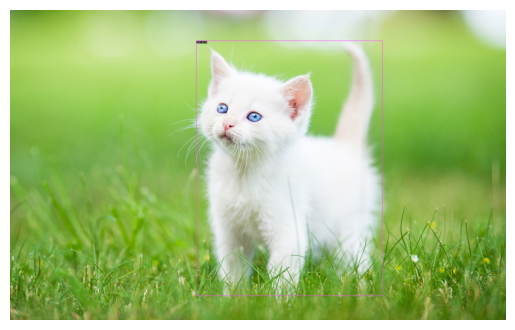

In [5]:
# verifying mmdet
!pip install -U openmim
!mim download mmdet --config rtmdet_tiny_8xb32-300e_coco --dest .
import cv2
import mmcv
from mmdet.apis import init_detector, inference_detector
from mmdet.registry import VISUALIZERS
import matplotlib.pyplot as plt
img = '/kaggle/input/images-for-testing/cat1.jpg'

config_file = 'rtmdet_tiny_8xb32-300e_coco.py'
checkpoint_file = 'rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'
model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or device='cuda:0'
# print(model)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
visualizer.dataset_meta = model.dataset_meta
img = cv2.imread(img)
result = inference_detector(model, img)

img = mmcv.imconvert(img, 'bgr', 'rgb')
visualizer.add_datasample(
name='result',
image=img,
data_sample=result,
draw_gt=False,
pred_score_thr=0.3,
show=False)

img = visualizer.get_image()
img = mmcv.imconvert(img, 'bgr', 'rgb')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) # converting BGR to RGB for using matplotlib
plt.axis('off')
plt.show()

In [6]:
from pycocotools.coco import COCO
import pandas as pd
import numpy as np

ROOT = '/kaggle/input/global-wheat-detection'
DATA_DIR = '/kaggle/input/global-wheat-detection-coco-dataset'
config = 'configs/global_wheat_detection/custom_config.py'

# Train Data
df = pd.read_csv(f'{ROOT}/train.csv')
df['image_path'] = ROOT + '/train/' + df['image_id'] + '.png'
tmp_df = df.drop_duplicates(subset=["image_id", "image_path"]).reset_index(drop=True)
tmp_df["bbox"] = df.groupby("image_id")["bbox"].agg(list).reset_index(drop=True)
df = tmp_df.copy()
df['num_ins'] = df.bbox.map(lambda x: len(x))
print(df.head())

    image_id  width  height  \
0  b6ab77fd7   1024    1024   
1  b53afdf5c   1024    1024   
2  7b72ea0fb   1024    1024   
3  91c9d9c38   1024    1024   
4  41c0123cc   1024    1024   

                                                bbox   source  \
0  [[0, 654, 37, 111], [0, 817, 135, 98], [0, 192...  usask_1   
1  [[765.0, 879.0, 116.0, 79.0], [84.0, 539.0, 15...  usask_1   
2  [[437.0, 988.0, 98.0, 36.0], [309.0, 527.0, 11...  usask_1   
3  [[89.0, 256.0, 113.0, 107.0], [216.0, 282.0, 1...  usask_1   
4  [[709.0, 97.0, 204.0, 105.0], [775.0, 250.0, 1...  usask_1   

                                          image_path  num_ins  
0  /kaggle/input/global-wheat-detection/train/b6a...       55  
1  /kaggle/input/global-wheat-detection/train/b53...       20  
2  /kaggle/input/global-wheat-detection/train/7b7...       25  
3  /kaggle/input/global-wheat-detection/train/91c...       41  
4  /kaggle/input/global-wheat-detection/train/41c...       25  


loading annotations into memory...
Done (t=2.13s)
creating index...
index created!


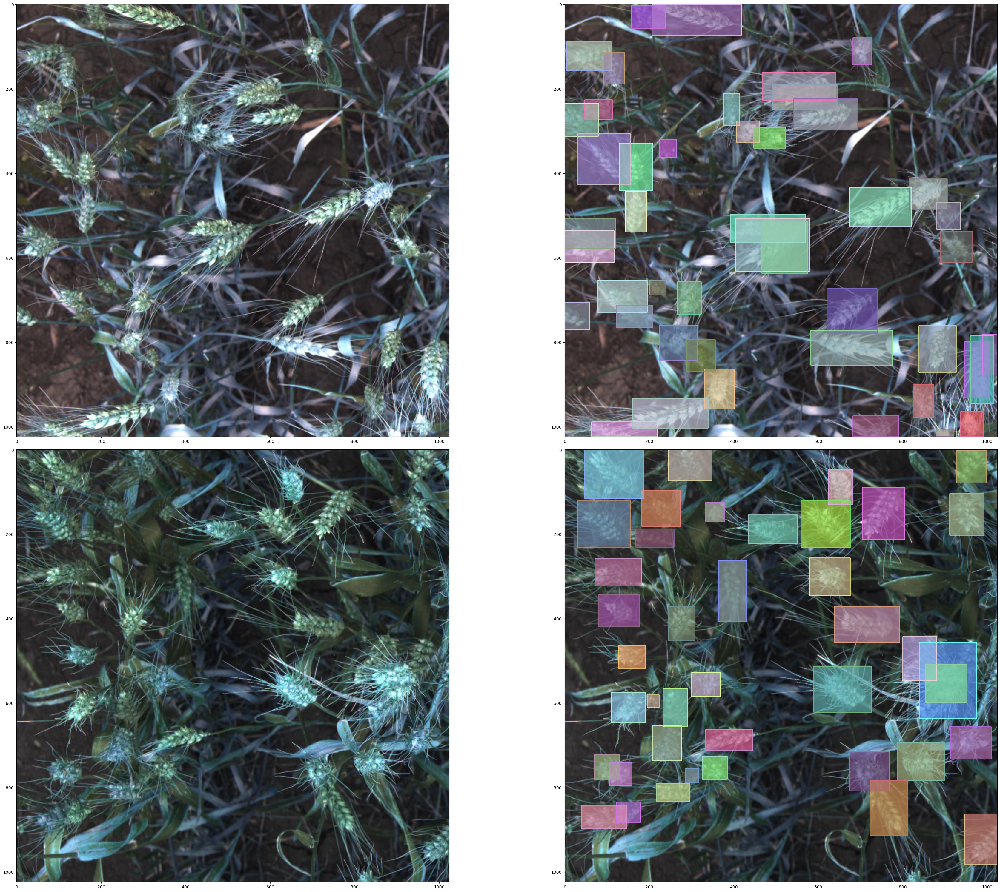

65

In [7]:
annFile = f'{DATA_DIR}/annotations_train.json'
coco    = COCO(annFile)
imgIds  = coco.getImgIds()

tmp_df = df.query("num_ins<=30 and num_ins>=15").head(2)
_,axs = plt.subplots(len(tmp_df),2,figsize=(40,15 * len(tmp_df)))
for (_, row), ax in zip(tmp_df.iterrows(), axs):
    img = cv2.imread(DATA_DIR+f'/train2020/{row.image_id}.jpg')
    img_img = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8)).apply(img[...,0])
    annIds  = coco.getAnnIds(imgIds=[row.image_id])
    anns    = coco.loadAnns(annIds)
    ax[0].imshow(img)
    ax[1].imshow(img)
    plt.sca(ax[1])
    coco.showAnns(anns, draw_bbox=True)
plt.tight_layout()
plt.show()
del coco; gc.collect()

In [8]:
!rm -r /kaggle/working/mmdetection
!cp -r /kaggle/input/mmdetection-3-1-evn/src/mmdetection-main-3 /kaggle/working/mmdetection
%cd mmdetection

rm: cannot remove '/kaggle/working/mmdetection': No such file or directory
/kaggle/working/mmdetection


In [9]:
!mkdir -p configs/global_wheat_detection

In [10]:
from mmengine.config import Config
base="detr_r50_8xb2-150e_coco"
cfg = Config.fromfile(f'/kaggle/working/mmdetection/configs/detr/{base}.py')
#----------------------------------------------------
width=1024
height=1024

max_epochs=10

batch_size=4
num_classes=1

dataset_type = 'CocoDataset' 
classes = ('wheat_head','glomerulus') 
data_root = '/kaggle/input/global-wheat-detection-coco-dataset'
#-----------------------------------------------------
cfg.model.bbox_head.num_classes = num_classes
#-----------------------------------------------------
cfg.train_pipeline[2]['scale']=(width,height)
cfg.test_pipeline [1]['scale']=(width,height)
#-----------------------------------------------------
cfg.train_dataloader.dataset.type=dataset_type
cfg.train_dataloader.dataset.metainfo=dict(classes=classes)
cfg.train_dataloader.dataset.data_root=data_root
cfg.train_dataloader.dataset.ann_file='/kaggle/input/global-wheat-detection-coco-dataset/annotations_train.json'
cfg.train_dataloader.dataset.data_prefix=dict(img='train2020/')
cfg.train_dataloader.batch_size=batch_size
#cfg.train_dataloader.dataset.pipeline[2]['scale']=(width,height)
#-----------------------------------------------------
cfg.val_dataloader.dataset.type=dataset_type
cfg.val_dataloader.dataset.metainfo=dict(classes=classes)
cfg.val_dataloader.dataset.data_root=data_root
cfg.val_dataloader.dataset.ann_file='/kaggle/input/global-wheat-detection-coco-dataset/annotations_valid.json'
cfg.val_dataloader.dataset.data_prefix=dict(img='valid2020/')
#cfg.val_dataloader.dataset.pipeline[1]['scale']=(width,height)
#-----------------------------------------------------
cfg.test_dataloader.dataset.type=dataset_type
cfg.test_dataloader.dataset.metainfo=dict(classes=classes)
cfg.test_dataloader.dataset.data_root=data_root
cfg.test_dataloader.dataset.ann_file='/kaggle/input/global-wheat-detection-coco-dataset/annotations_valid.json'
cfg.test_dataloader.dataset.data_prefix=dict(img='valid2020/')
#cfg.test_dataloader.dataset.pipeline[1]['scale']=(width,height)
#------------------------------------------------------
#------------------------------------------------------
cfg.val_evaluator.type='CocoMetric'
cfg.val_evaluator.ann_file='/kaggle/input/global-wheat-detection-coco-dataset/annotations_valid.json'
cfg.val_evaluator.metric=['bbox']

cfg.test_evaluator.type='CocoMetric'
cfg.test_evaluator.ann_file='/kaggle/input/global-wheat-detection-coco-dataset/annotations_valid.json'
cfg.test_evaluator.metric=['bbox']
#------------------------------------------------------
cfg.train_cfg.max_epochs=max_epochs
cfg.optim_wrapper.type='OptimWrapper'
cfg.optim_wrapper.optimizer=dict(type='AdamW',lr=0.001,weight_decay=0.05,eps=1e-8,betas=(0.9, 0.999))
cfg.default_hooks = dict(logger=dict(type='LoggerHook', interval=200),
                         checkpoint=dict(type='CheckpointHook', interval=1, save_best='coco/bbox_mAP'))
#------------------------------------------------------
cfg.load_from = "https://download.openmmlab.com/mmdetection/v3.0/detr/detr_r50_8xb2-150e_coco/detr_r50_8xb2-150e_coco_20221023_153551-436d03e8.pth"

#------------------------------------------------------
!mkdir -p configs/HuBMAP
config=f'configs/global_wheat_detection/custom_config.py'
with open(config, 'w') as f:
    f.write(cfg.pretty_text)
    
#https://www.kaggle.com/code/ammarnassanalhajali/hubmap-2023-mmdetection-3-1-training/notebook

In [11]:
!python tools/train.py {config}

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
11/19 10:01:35 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 | packaged by conda-forge | (main, Jun 23 2023, 22:40:32) [GCC 12.3.0]
    CUDA available: True
    numpy_random_seed: 1826814558
    GPU 0: Tesla P100-PCIE-16GB
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: gcc (Ubuntu 11.3.0-1ubuntu1~22.04.1) 11.3.0
    PyTorch: 2.0.0
    PyTorch compiling details: PyTorch built with:
  - GCC 11.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2023.1-Product Build 20230303 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17